# **YOLOv9:**

In [ ]:
!nvidia-smi

Wed Mar 13 22:16:53 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install -U -q ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 721.2/721.2 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 59.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 65.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 89.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/digits_original_crops.zip
!unzip -q drive/MyDrive/DP/VEGA/data/YOLO/glyphs_original_crops.zip

In [ ]:
from ultralytics import YOLO
from supervision import Detections, DetectionDataset, InferenceSlicer, BoxAnnotator, MaskAnnotator, plot_image
from supervision.draw.color import Color, ColorPalette
from PIL import Image
import numpy as np
import cv2
!yolo checks

Ultralytics YOLOv8.1.27 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.4/78.2 GB disk)

OS                  Linux-6.1.58+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.2.1+cu121>=1.8.0
torchvision         ✅ 0.17.1+cu121>=0.9.0
tqdm                ✅ 4.66.2>=4.64.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 1.5.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0


## Digits:

In [ ]:
digits_model = YOLO("/content/drive/MyDrive/DP/VEGA/weights/yolo_v9_digits_best.pt")

In [ ]:
digits_model_test_metrics = digits_model.val(data="/content/digits_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.27 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25326958 parameters, 0 gradients, 102.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 22.2MB/s]
val: Scanning /content/digits_original_crops/test/labels... 451 images, 0 backgrounds, 0 corrupt: 100%|██████████| 451/451 [00:00<00:00, 1199.25it/s]


val: New cache created: /content/digits_original_crops/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:27<00:00,  1.07it/s]


                   all        451       6188      0.979      0.981      0.988      0.846
                     0        451        571      0.989      0.982      0.991       0.86
                     1        451       1111      0.983      0.985      0.992       0.86
                     2        451        629      0.973      0.985      0.988      0.822
                     3        451       1120      0.977      0.987      0.989      0.859
                     4        451        531      0.973      0.976      0.982      0.837
                     5        451        433      0.969      0.986      0.977      0.848
                     6        451        475      0.991      0.979       0.99       0.86
                     7        451        449      0.987      0.987      0.993      0.816
                     8        451        492      0.987       0.97      0.991      0.832
                     9        451        377      0.957      0.979      0.984      0.862
Speed: 0.8ms preproce


0: 640x640 5 0s, 7 1s, 3 2s, 6 3s, 3 4s, 1 5, 3 7s, 1 8, 1 9, 49.6ms
Speed: 1.5ms preprocess, 49.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


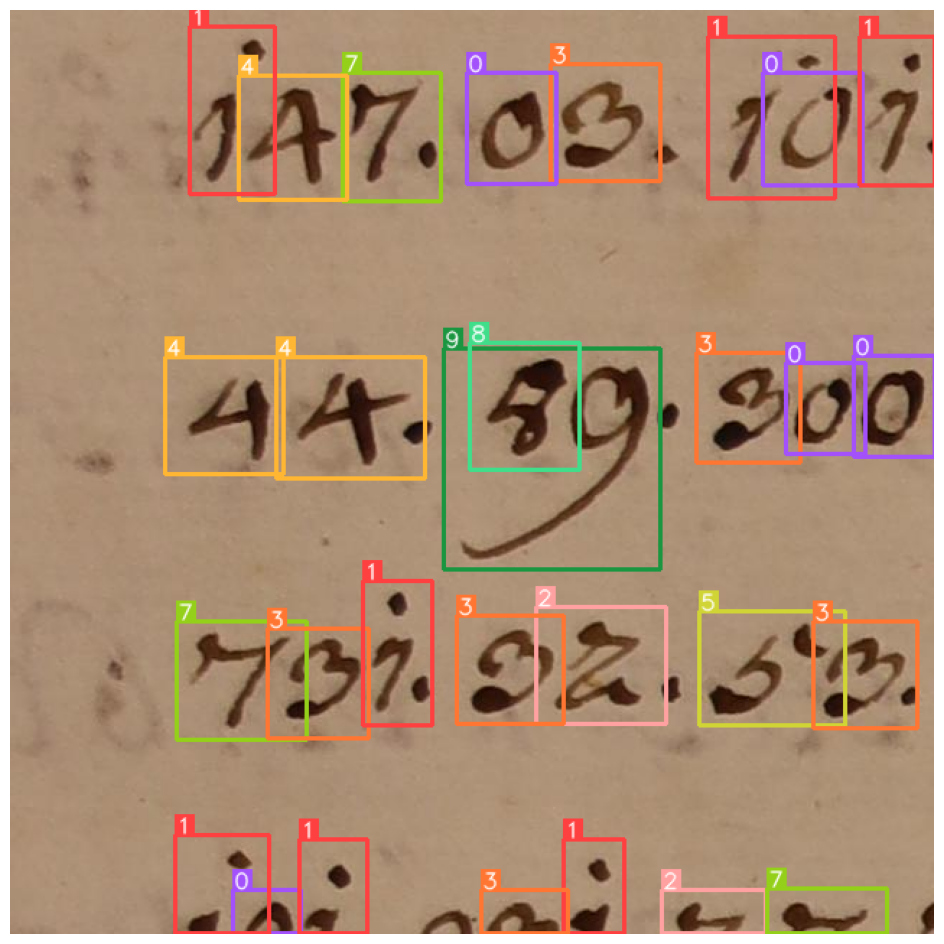

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg")
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/digits_original_crops/test/images/IMG_1396_col320_row2240_jpg.rf.544b449487d06932a6292e1ef744ab20.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2144 36 0s, 42 1s, 10 2s, 36 3s, 35 4s, 21 5s, 30 6s, 22 7s, 65 8s, 3 9s, 540.8ms
Speed: 78.5ms preprocess, 540.8ms inference, 52.8ms postprocess per image at shape (1, 3, 3200, 2144)


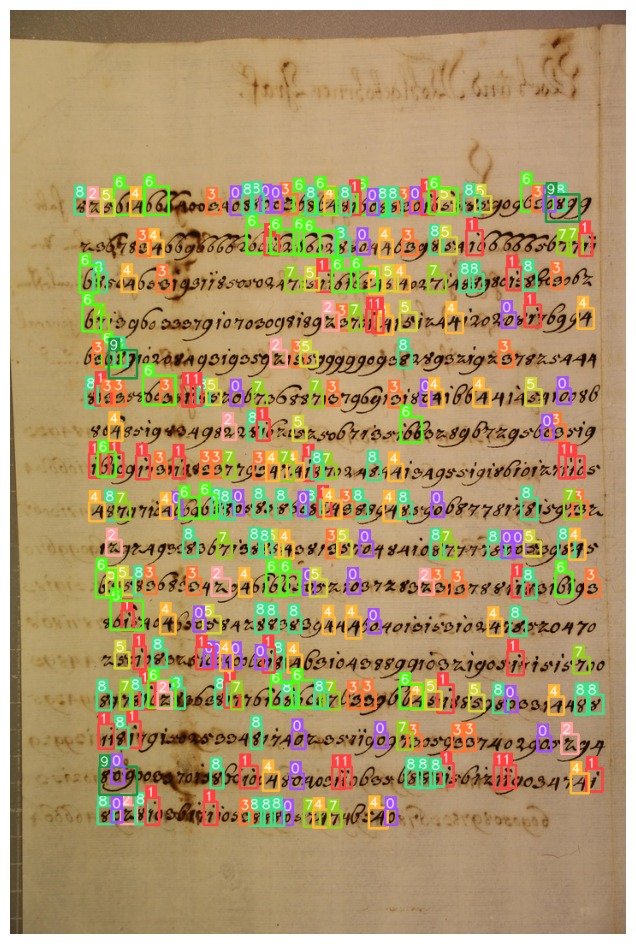

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)


0: 3200x2400 2 0s, 10 1s, 3 2s, 12 3s, 24 4s, 10 5s, 6 7s, 10 9s, 612.7ms
Speed: 68.0ms preprocess, 612.7ms inference, 2.1ms postprocess per image at shape (1, 3, 3200, 2400)


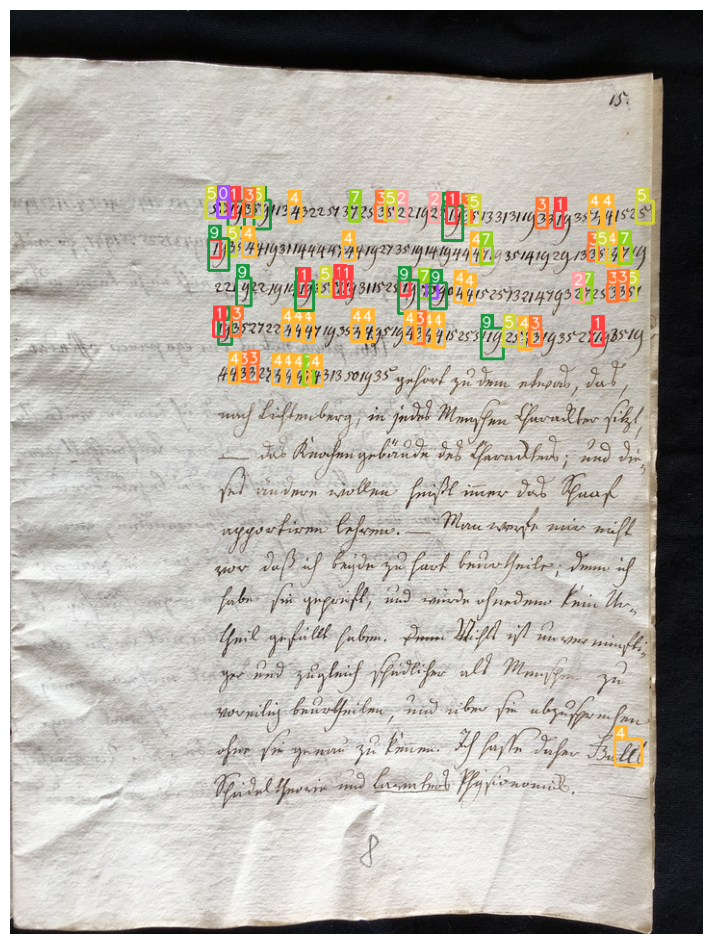

In [ ]:
digits_detections = Detections.from_ultralytics(
    digits_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
        imgsz=3200
    )[0]
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_detections
)
plot_image(digits_annotated_array)

## SAHI Digits:

In [ ]:
def digits_model_callback(x: np.ndarray) -> Detections:
    result = digits_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [ ]:
digits_sahi_model = InferenceSlicer(
    callback=digits_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

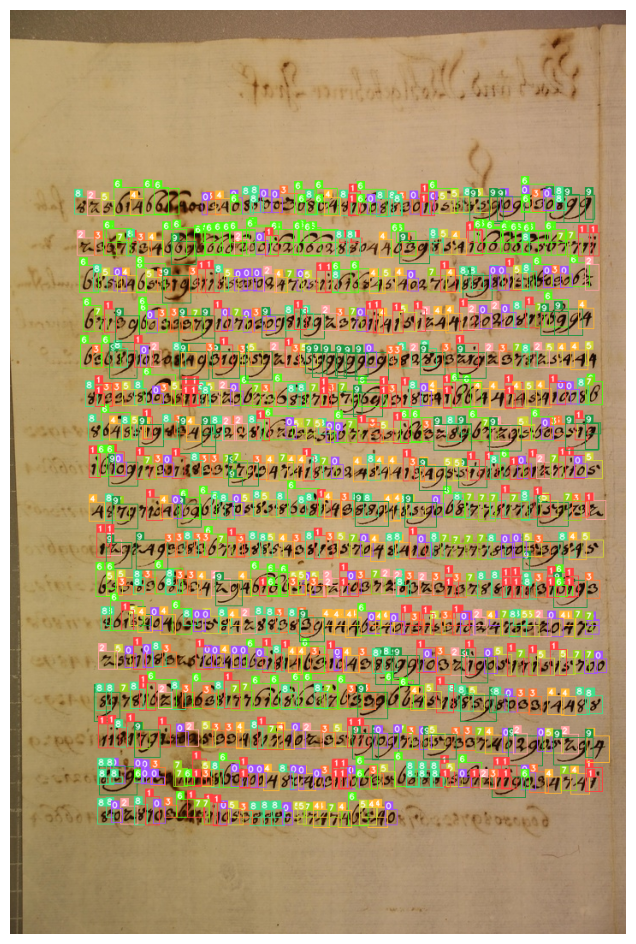

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/digits1.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

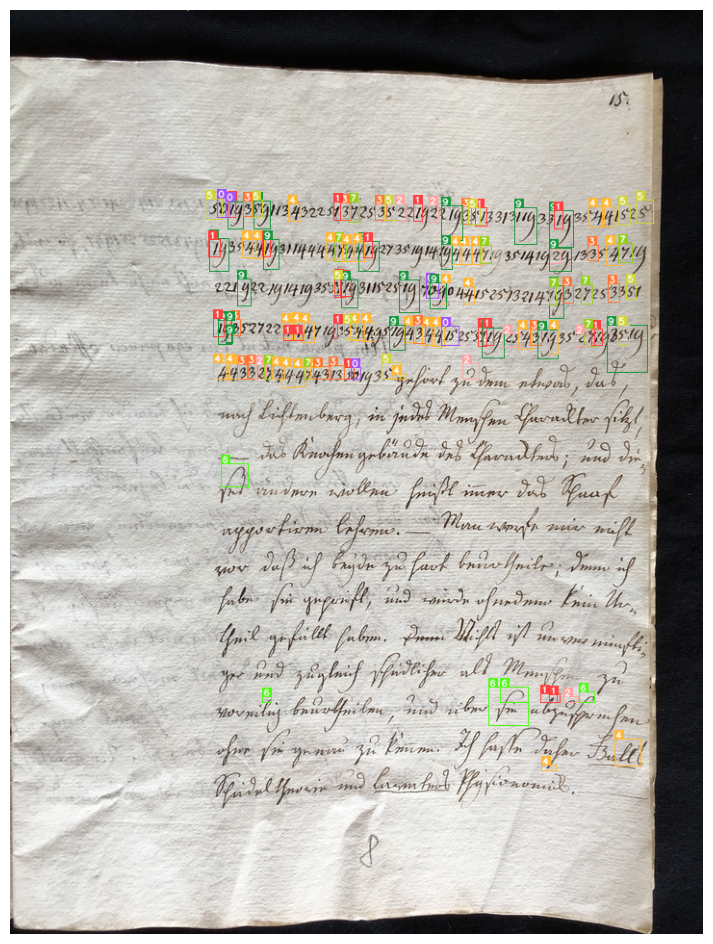

In [ ]:
digits_sahi_detections = digits_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
)

digits_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/letter7.jpg"),
    detections=digits_sahi_detections
)
plot_image(digits_annotated_array)

## Glyphs:

In [ ]:
glyphs_model = YOLO("/content/drive/MyDrive/DP/VEGA/weights/yolo_v9_glyphs_best.pt")

In [ ]:
glyphs_model_test_metrics = glyphs_model.val(data="/content/glyphs_original_crops/data.yaml", split="test")

Ultralytics YOLOv8.1.27 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv9c summary (fused): 384 layers, 25444150 parameters, 0 gradients, 103.0 GFLOPs


val: Scanning /content/glyphs_original_crops/test/labels... 1627 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1627/1627 [00:01<00:00, 1256.41it/s]


val: New cache created: /content/glyphs_original_crops/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 102/102 [00:57<00:00,  1.78it/s]


                   all       1627       3656      0.982      0.982      0.992      0.983
                     N       1627         21      0.996          1      0.995      0.995
                     Q       1627         23      0.996          1      0.995      0.995
                     R       1627         19      0.996          1      0.995      0.992
                     W       1627         22      0.995          1      0.995      0.995
                 Z - -       1627         27      0.997          1      0.995      0.983
                 Z - I       1627         27          1      0.883      0.995      0.984
                     Z       1627         24      0.996          1      0.995      0.995
                 u0023       1627         19      0.998          1      0.995      0.912
                 u002a       1627         24      0.995      0.958      0.992      0.864
                 u003d       1627         25      0.979          1      0.995      0.995
                 u004


0: 640x640 1 u0023, 1 u002a, 1 u0043, 1 u0186, 1 u0223, 1 u03a5, 1 u03c0, 1 u0564, 1 u25a1, 49.6ms
Speed: 2.6ms preprocess, 49.6ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)


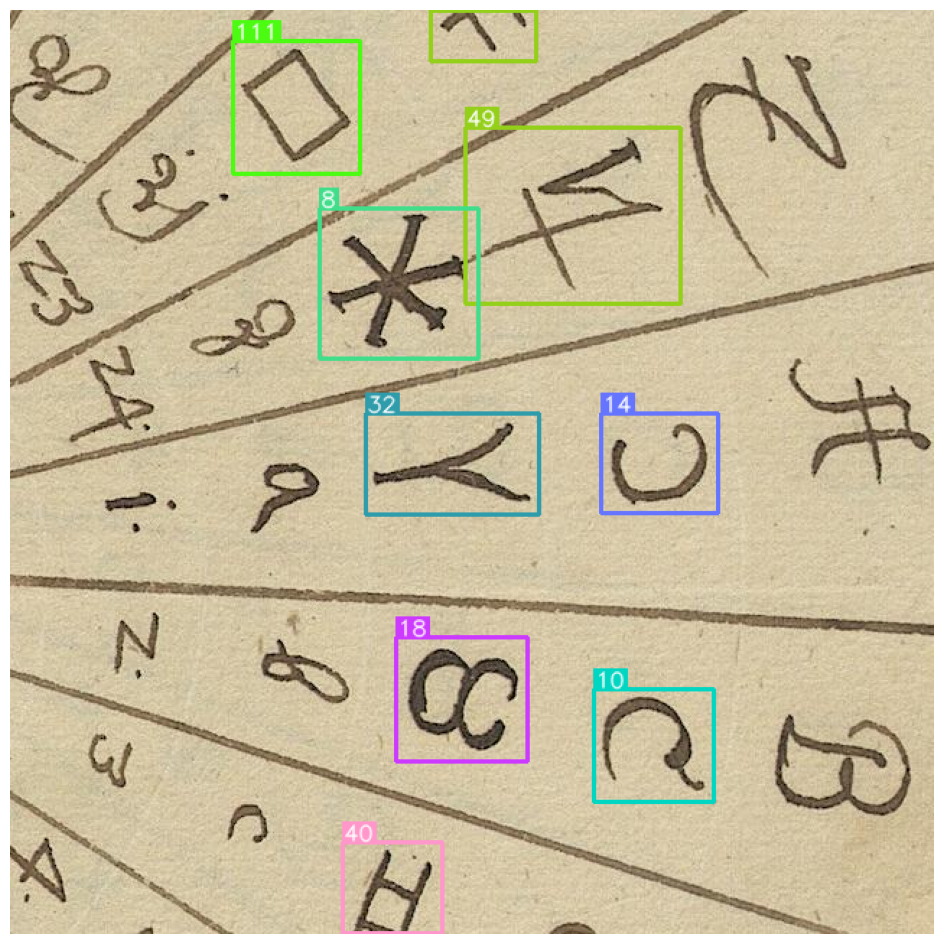

In [ ]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg")
    )[0]
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/glyphs_original_crops/test/images/hhstaw_130_i_1576_0089_jpg_col1600_row1600_jpg.rf.40fc3cd09c8d0440a4cea59cad864d2f.jpg"),
    detections=glyphs_detections
)
glyphs_annotated_array = MaskAnnotator().annotate(
    scene=glyphs_annotated_array,
    detections=glyphs_detections
)
plot_image(glyphs_annotated_array)


0: 3200x2144 1 Z - -, 1 Z, 1 u002a, 1 u0043, 1 u0186, 1 u0293, 1 u039b, 1 u03a5, 1 u03b2, 1 u03c9, 1 u06ba, 1 u0ce7, 1 u10dd, 1 u1dc9, 1 u1f75e, 1 u25a1, 1 u25b3 - _, 2 u2609 D I I Is, 1 u263E, 1 u263f, 1 u2642, 1 u2644, 1 u2652, 1 u27dc R I, 1 u29df - I, 1 u2ad8, 1 u2aef - I, 1 u2af0, 539.3ms
Speed: 79.7ms preprocess, 539.3ms inference, 2.1ms postprocess per image at shape (1, 3, 3200, 2144)


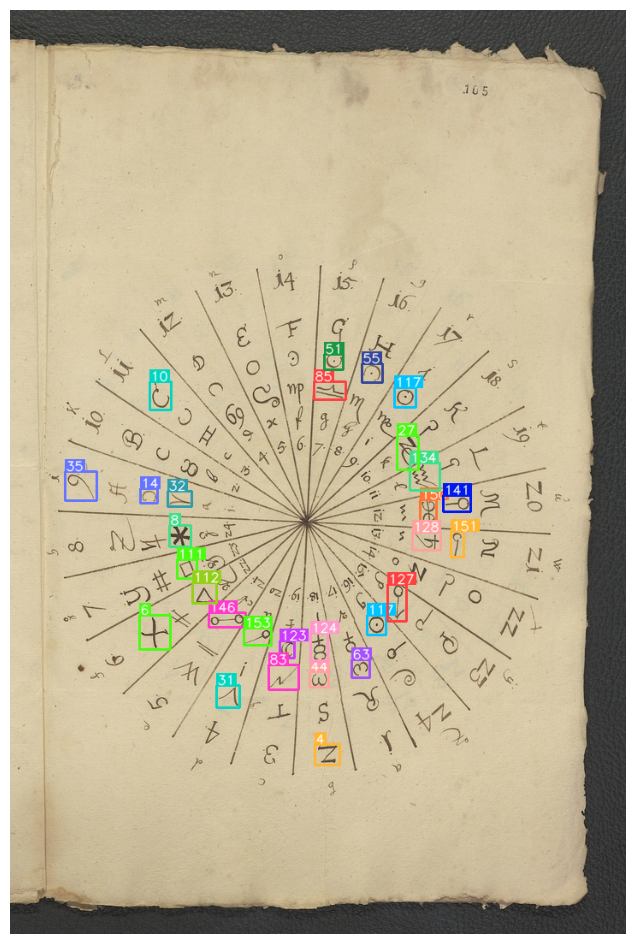

In [ ]:
glyphs_detections = Detections.from_ultralytics(
    glyphs_model.predict(
        source=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
        imgsz=3200
    )[0]
)

glpyhs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=2,
    text_scale=0.5,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_detections
)
plot_image(glpyhs_annotated_array)

## SAHI Glyphs:

In [ ]:
def glyphs_model_callback(x: np.ndarray) -> Detections:
    result = glyphs_model(x, verbose=False, conf=0.25)[0]
    return Detections.from_ultralytics(result)

In [ ]:
glyphs_sahi_model = InferenceSlicer(
    callback=glyphs_model_callback,
    slice_wh=(160, 160),
    overlap_ratio_wh=(0.3, 0.3)
)

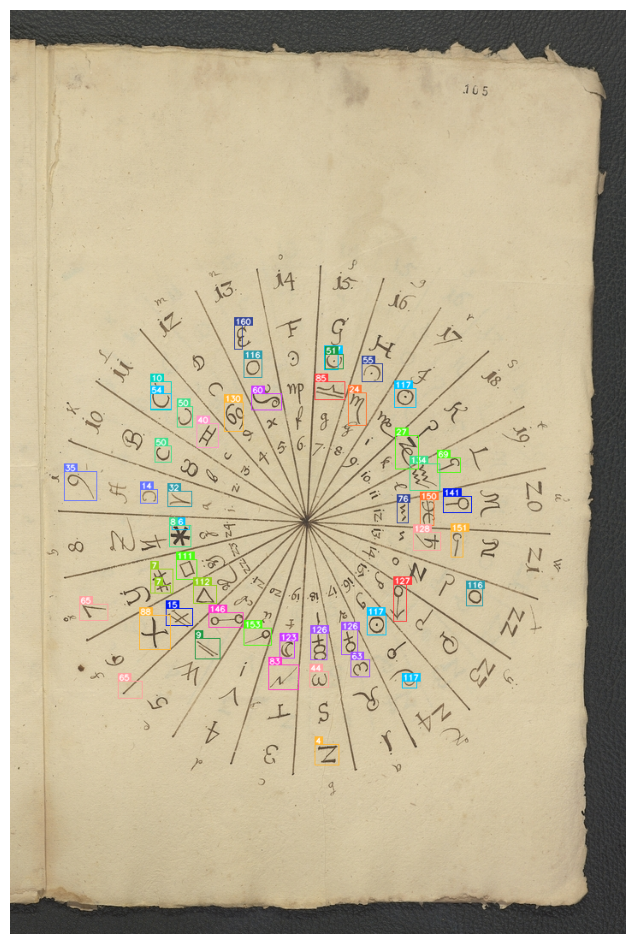

In [ ]:
glyphs_sahi_detections = glyphs_sahi_model(
    image=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
)

glyphs_annotated_array = BoxAnnotator(
    text_color=Color.WHITE,
    thickness=1,
    text_scale=0.3,
    text_thickness=1,
    text_padding=1
).annotate(
    scene=cv2.imread("/content/drive/MyDrive/DP/VEGA/data/BENCHMARK/glyphs1.jpg"),
    detections=glyphs_sahi_detections
)
plot_image(glyphs_annotated_array)